In [ ]:
import numpy as np
import math
from matplotlib import pyplot as plt
from matplotlib import colors
from IPython import display
import random

# Inputs.
grid_size = 3
path = "/content/drive/MyDrive/Nicolas - Personal/2024/Johns Hopkins/Project"
original_track = np.genfromtxt(path + '/track.csv', delimiter=',')
directions = np.genfromtxt(path + '/directions.csv', delimiter=',')

# Track rows and columns
track_rows = len(original_track)
track_cols = int(original_track.size/len(original_track))
print(track_rows)
print(track_cols)

# Build input and output training data.
training_input = []
training_output = []
for r in range(0, track_rows - grid_size + 1):
  for c in range(0, track_cols - grid_size + 1):
    track_pov = original_track[r: r+grid_size, c: c+grid_size]
    direct_pov = directions[r: r+grid_size, c: c+grid_size]
    center = direct_pov[int((grid_size-1)/2), int((grid_size-1)/2)]
    if center != 0:
      # print(track_pov)
      # print(center)
      training_input.append(track_pov)
      if center > 4:
          center -= 4
      zeros_list = [0 for i in range(0, 4)]
      zeros_list[int(center)-1] = 1
      training_output.append(zeros_list)

# Training data size
print(len(training_input))
print(len(training_output))

38
25
186
186


In [ ]:
from tensorflow import keras
from keras.layers import Activation

# Build the model.
model = keras.Sequential([
  keras.layers.Flatten(input_shape=(grid_size, grid_size)),
  keras.layers.Dense(12),
  keras.layers.Dense(4, activation="softmax")
])

# Compile the model.
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
model.optimizer.learning_rate = 0.01

# Train the model.
model.fit(np.array(training_input), np.array(training_output), epochs=100)

Epoch 1/100
6/6 [==============================] - 2s 14ms/step - loss: 0.1897 - accuracy: 0.3871
Epoch 2/100
6/6 [==============================] - 0s 5ms/step - loss: 0.1562 - accuracy: 0.6290
Epoch 3/100
6/6 [==============================] - 0s 6ms/step - loss: 0.1392 - accuracy: 0.5484
Epoch 4/100
6/6 [==============================] - 0s 5ms/step - loss: 0.1309 - accuracy: 0.5591
Epoch 5/100
6/6 [==============================] - 0s 5ms/step - loss: 0.1188 - accuracy: 0.6237
Epoch 6/100
6/6 [==============================] - 0s 10ms/step - loss: 0.1082 - accuracy: 0.6882
Epoch 7/100
6/6 [==============================] - 0s 7ms/step - loss: 0.0983 - accuracy: 0.7742
Epoch 8/100
6/6 [==============================] - 0s 8ms/step - loss: 0.0884 - accuracy: 0.8817
Epoch 9/100
6/6 [==============================] - 0s 10ms/step - loss: 0.0792 - accuracy: 0.8817
Epoch 10/100
6/6 [==============================] - 0s 8ms/step - loss: 0.0726 - accuracy: 0.8817
Epoch 11/100
6/6 [========

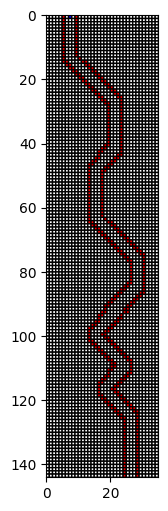

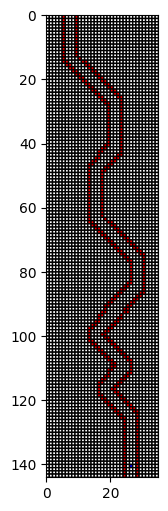

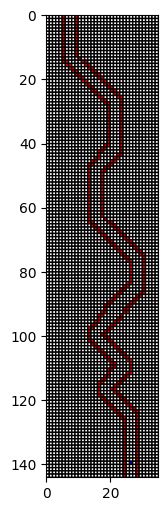

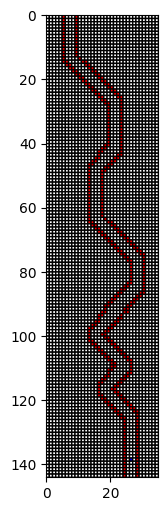

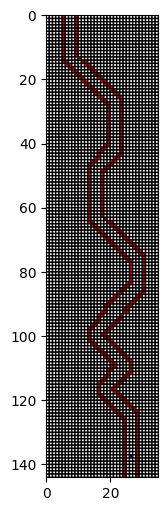

...

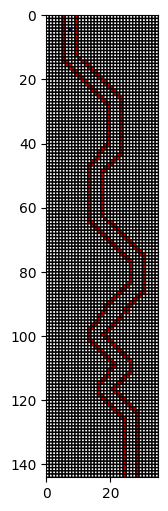

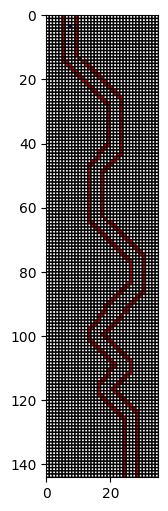

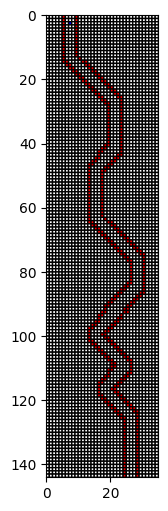

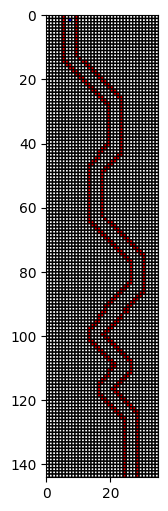

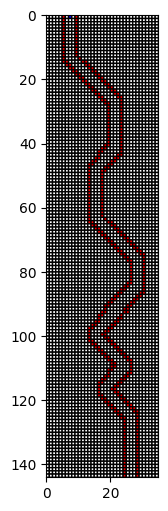

In [ ]:
# Plot
cmap = colors.ListedColormap(['white','red', 'blue'])
def generate_plot(track):
  plt.figure(figsize=(6,6))
  plt.gca().invert_yaxis()
  plt.pcolor(track,cmap=cmap,edgecolors='k', linewidths=1)
  plt.gca().set_aspect('equal')
  display.clear_output(wait=True)
  display.display(plt.gcf())
  # plt.pause(0.0001)
  # plt.show()

# Starting point
r_start = 140
c_start = 26

# Test
r = r_start
c = c_start
# track = original_track.copy()
original_track = np.genfromtxt(path + '/test_track.csv', delimiter=',')
track = original_track.copy()

steps = []
for i in range(0, 200):
  # Show plot
  # track[r, c] = 2
  steps.append([r, c])
  # generate_plot(track)

  # Predict next movement.
  r_low_grid = r - int((grid_size-1)/2)
  c_low_grid = c - int((grid_size-1)/2)
  track_pov = original_track[r_low_grid: r_low_grid+grid_size, c_low_grid: c_low_grid+grid_size]
  if (len(track_pov) < grid_size):
    break
  predicted = model.predict(np.array([track_pov]))[0]
  next_movement = np.argmax(predicted) + 1
  # print(track_pov)
  # print(next_movement)

  # track[r, c] = 0
  if next_movement == 1:
    r -= 1
  elif next_movement == 2:
    r -= 1
    c += 1
  elif next_movement == 3:
    c += random.choice([-1, 1])
  elif next_movement == 4:
    r -= 1
    c -= 1

for step in steps:
  r = step[0]
  c = step[1]
  track[r, c] = 2
  generate_plot(track)
  track[r, c] = 0

